# Task 1
## Picture Analysis

I will use ready implementation of Discrete Fourier Transform, as well as Inverse DFT from **numpy** library.
**Pillow** (**PIL**) library will be useful for image reading, displaying and converting into matrix.

In [2]:
import numpy as np
from numpy import rot90
from numpy.fft import fft2, ifft2

import PIL as pillow
from PIL import Image

import os

RED = (255, 0, 0)

To convert an RGB image into grayscale I used ready pillow implementation, since it's not simply calculating arithmetic mean.
Converting the other way is trivial.

In [3]:
def to_grayscale(image, invert_colors=False):
    grayscale = image.convert('L')
    if invert_colors:
        return pillow.ImageOps.invert(grayscale)
    return grayscale

def from_grayscale(image):
    image_array = np.asarray(image)
    return np.array(
        [[(val, val, val) for val in row] for row in image_array]
    )

def scale_image(image, factor):
    return image.resize(np.array(image.size) * factor)

# Image I: Gallic War by Julius Caesar
### Goal: Find all 'e' letters

![Gallia est omnis divisa in partes tres, quarum unam incolunt Belgae, aliam Aquitani, tertiam qui ipsorum lingua Celtae, nostra Galli appellantur.
 Hi omnes lingua, institutis, legibus inter se differunt. Gallos ab Aquitanis Garumna flumen, a Belgis Matrona et Sequana dividit.
 Horum omnium fortissimi sunt Belgae, propterea quod a cultu atque humanitate provinciae longissime absunt,
 minimeque ad eos mercatores saepe commeant atque ea quae ad effeminandos animos pertinent important, proximique sunt Germanis.
 ](img\\task1\\galia.png "Gallic War by Julius Caesar")

Since most of the image is white (maximum value) and letters are black (minimal value) we invert the colors.

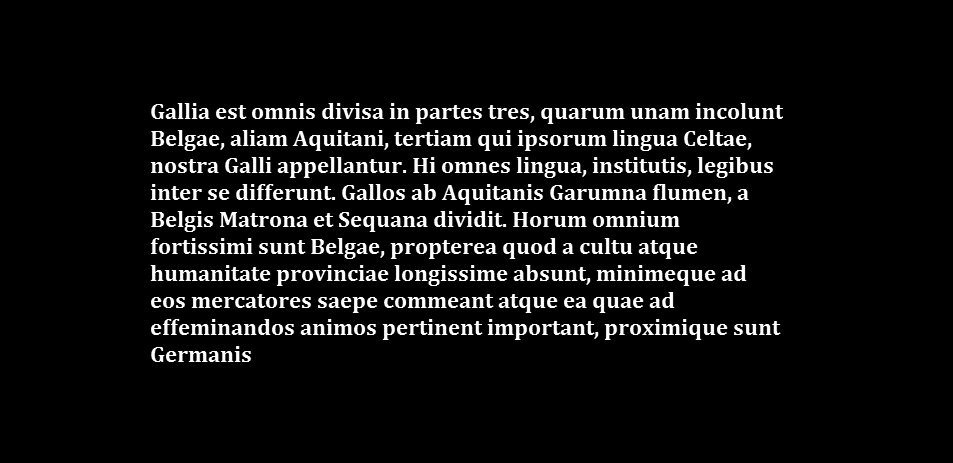

In [4]:
IMAGE_DIRECTORY = os.path.join("img", "task1")

galia = to_grayscale(
    image=Image.open(os.path.join(IMAGE_DIRECTORY, "galia.png")),
    invert_colors=True
)
e_letter = to_grayscale(
    image=Image.open(os.path.join(IMAGE_DIRECTORY, "galia_e.png")),
    invert_colors=True
)

display(galia)

## DFT on the Image

After the DFT each pixel is a complex number.

In [5]:
def get_dft_phase_and_modulus_images(image):
    image_arr = np.asarray(image)
    result = np.fft.fft2(image_arr)

    modulus = np.log(np.absolute(result))
    # modulus = np.absolute(result)
    modulus /= np.max(modulus)
    modulus *= 255

    modulus_image = Image.fromarray(modulus)
    modulus_image = modulus_image.convert('RGB')

    phase = (np.angle(result) + np.pi) * 255 / (2*np.pi)
    phase_image = Image.fromarray(phase)
    phase_image = phase_image.convert('RGB')

    return modulus_image, phase_image

### Modulus of each pixel

Note: Logarithm of the value is being displayed, since values differ a lot!

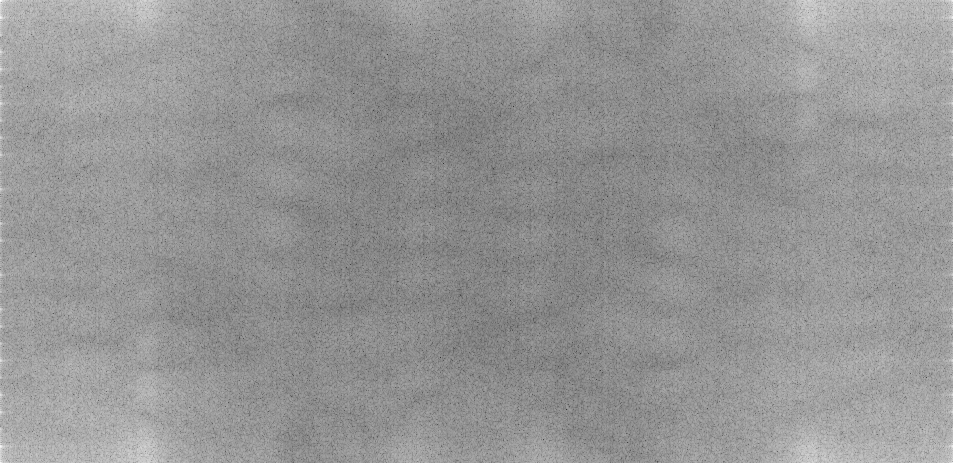

In [6]:
modulus_image, phase_image = get_dft_phase_and_modulus_images(image=galia)

display(modulus_image)

### Phase of each pixel

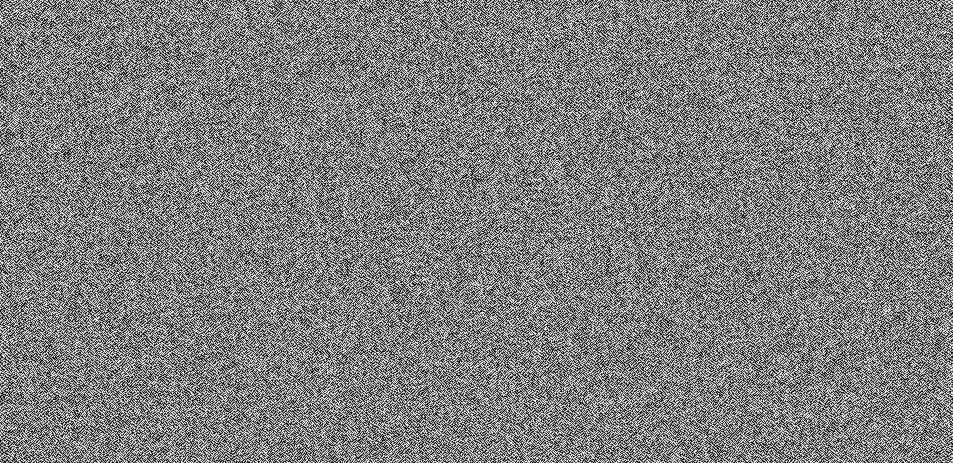

In [7]:
display(phase_image)

## Letter 'e' that we try to find

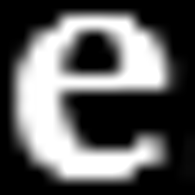

In [8]:
display(scale_image(e_letter, 15))

## Calculation of correlation given by the formula from the script

Note: At the end it is being divided by maximal correlation found, thus each pixel's value is range [0, 1].

In [9]:
def calculate_correlation(whole_image, searched_image):
    def rot180(arr):
        return rot90(rot90(arr))

    image_width, image_height = whole_image.size

    result = ifft2(
        fft2(whole_image) * fft2(rot180(searched_image), s=(image_height, image_width))
    ).real

    result /= np.abs(np.max(result))
    return result

In [10]:
def show_correlation(correlation):
    log_correlation = np.exp(correlation) - 1
    log_correlation /= np.max(log_correlation)
    log_correlation *= 255

    corelation_image = Image.fromarray(log_correlation)
    corelation_image = corelation_image.convert('RGB')

    display(corelation_image)

## Calculated correlation

The lighter each pixel is, the more likely it is that 'e' is located there.

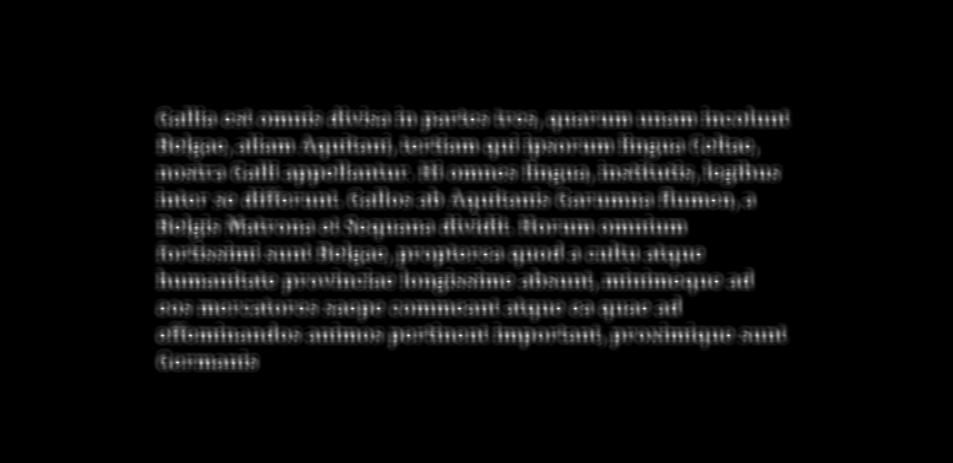

In [11]:
correlation = calculate_correlation(whole_image=galia, searched_image=e_letter)

show_correlation(correlation)

In [12]:
def show_found_elements(image_arr, correlation, certainty, selection_size, color=RED):
    found_locations = []
    for y in range(correlation.shape[0]):
        for x in range(correlation.shape[1]):
            if correlation[y, x] > certainty:
                found_locations.append((y, x))

    # result = from_grayscale(image=image)
    result = image_arr.copy()
    for (y, x) in found_locations:
        for dy in range(0, selection_size[0], np.sign(selection_size[0])):
            for dx in range(0, selection_size[1], np.sign(selection_size[1])):
                result[y + dy, x + dx] = color

    result_image = Image.fromarray(result)
    display(result_image)

## Found letters

The 0.95 certainty was chosen arbitrarly. Bigger value would result in ignoring some of 'e' letters, while smaller would lead to underlining simillar letters (like 'c' and 'o') as well.

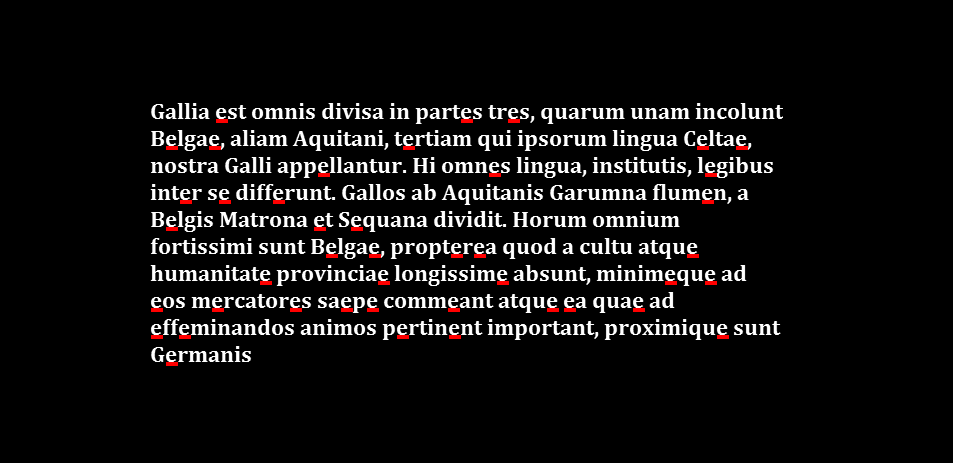

In [13]:
show_found_elements(
    image_arr=from_grayscale(galia),
    correlation=correlation,
    certainty=0.95,
    selection_size=(4, -12)
)

### Comment on result

Honestly, I have to admit, that I am quite surprised that the result is so good. Of course the *certainty* parameter had to be empirically determined, but I can imagine, that this process can be done once and work for lots of simmilar documents.

# Image II: Fishes
### Goal: Find this one fish

![Fishes](img\\task1\\fishes.jpg "Fishes")

We are looking for this handsome dude

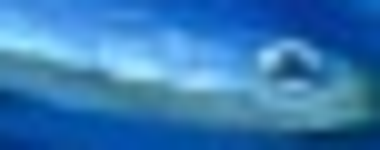

In [14]:
display(scale_image(Image.open(os.path.join(IMAGE_DIRECTORY, "fish1.png")), 10))

### Image preprocessing

Everything goes just as before with the exception that we do not invert colors this time. Picture is rather dark in general (has low values) and all interesting elements are lighter (higher values).

In [23]:
fishes_color = Image.open(os.path.join(IMAGE_DIRECTORY, "fishes.jpg")).convert('RGB')
fishes = to_grayscale(
    image=fishes_color,
    invert_colors=False
)

fish1 = to_grayscale(
    image=Image.open(os.path.join(IMAGE_DIRECTORY, "fish1.png")),
    invert_colors=False
)

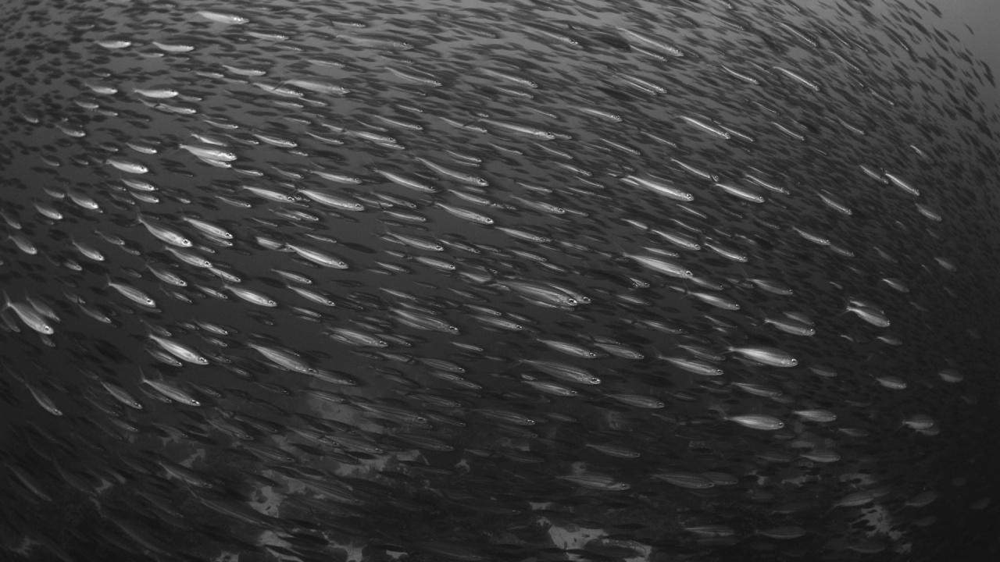

In [16]:
display(fishes)

### Modulus and phase of DFT

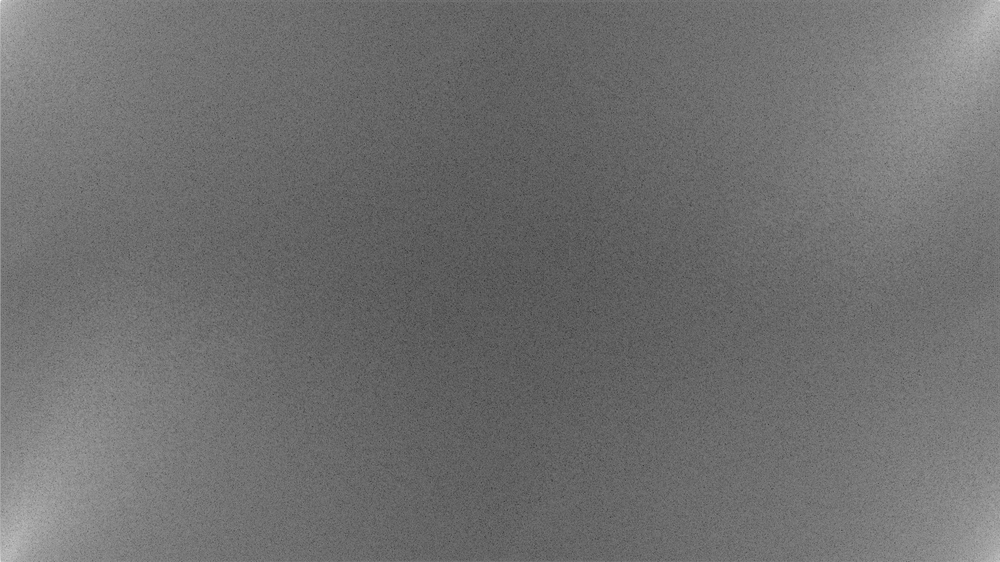

In [17]:
modulus_image, phase_image = get_dft_phase_and_modulus_images(image=fishes)
display(modulus_image)

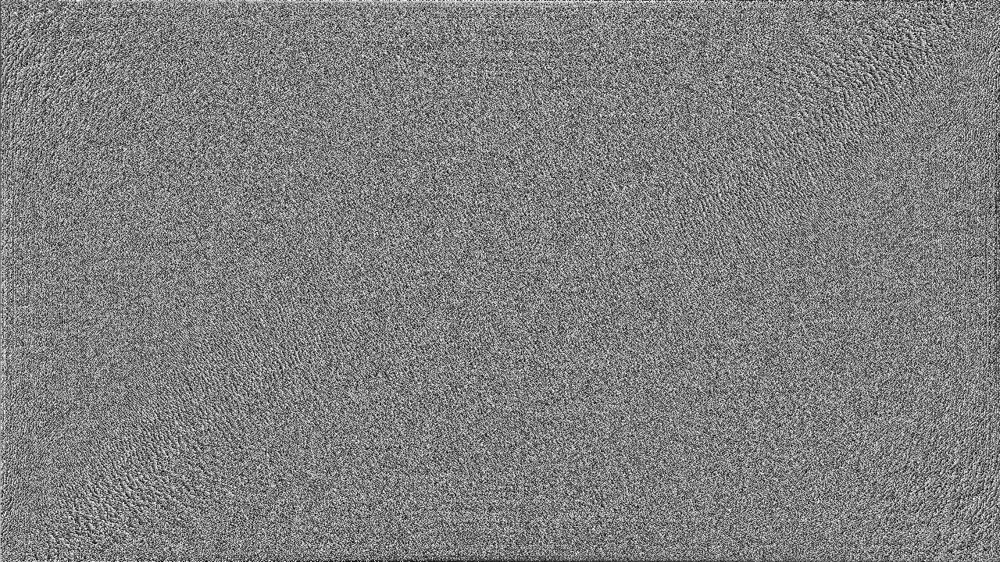

In [18]:
display(phase_image)

### Visualized correlation

We can observe, that the more each fish is simmilar to the one we are looking for, the lighter the spots.

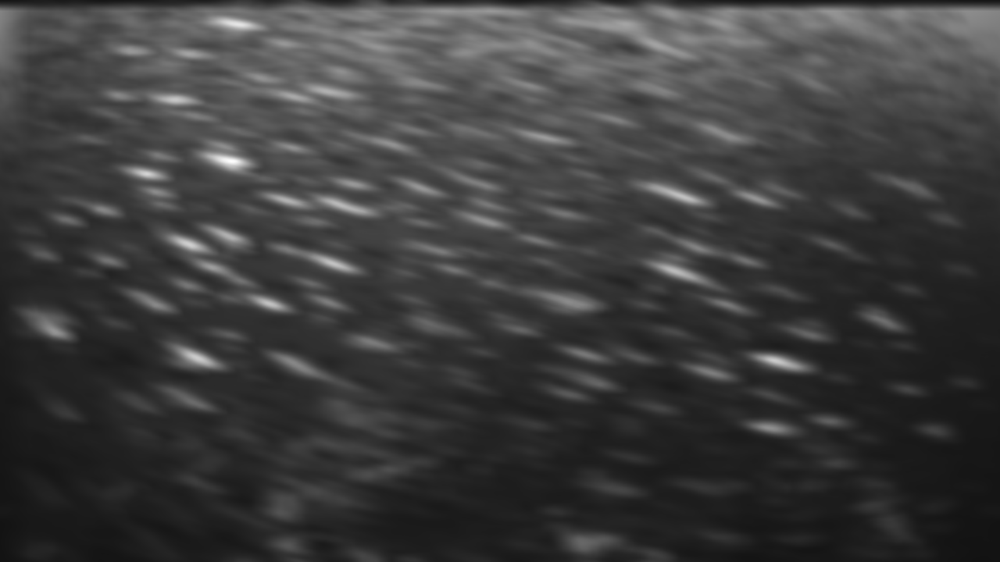

In [20]:
correlation = calculate_correlation(whole_image=fishes, searched_image=fish1)

show_correlation(correlation)

Let's try to find a match with 0.75 certainty or higher.

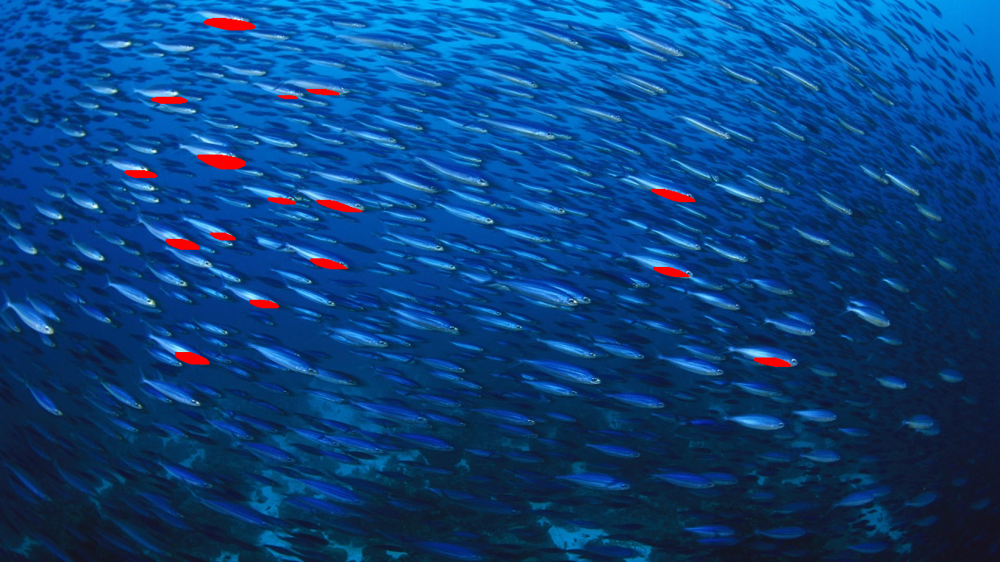

In [21]:
show_found_elements(
    image_arr=np.asarray(fishes_color),
    correlation=correlation,
    certainty=0.75,
    selection_size=(2, -15)
)

There are many matches, and it can be quite useful to look for a certain species of fish in general. But if we want to find this one specimen from the photo we need to use higher certainty.
Let's try 0.95:

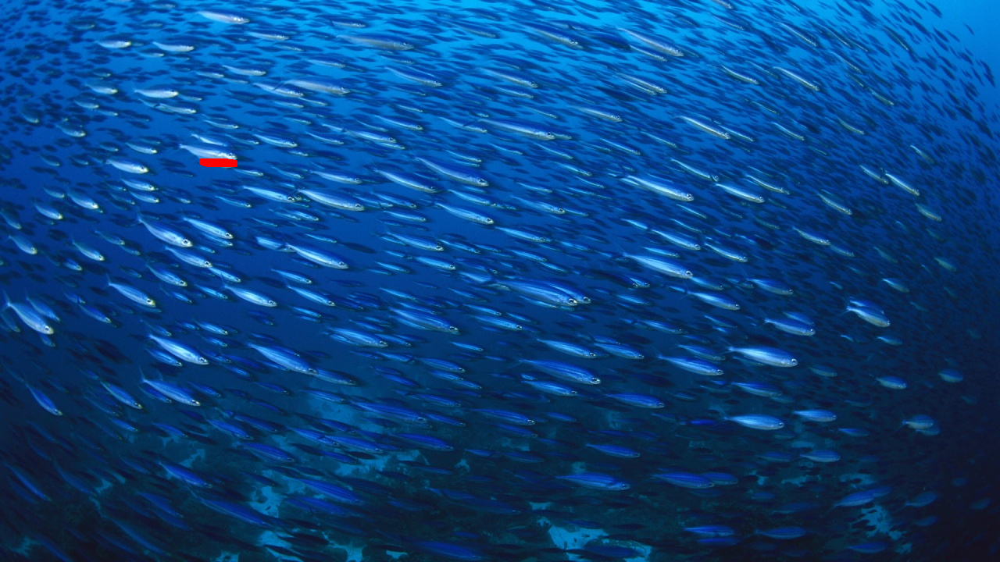

In [24]:
show_found_elements(
    image_arr=np.asarray(fishes_color),
    correlation=correlation,
    certainty=0.95,
    selection_size=(6, -30)
)

We found it! DFT proved to be very effective in searching image fragments.